# Pasos a Seguir:
1) identificar de donde salen las Rutas que estan en noExisten
2) usar funcion extraer_fecha y extraer_hora para comparar las fechas de las imagenes en la base dfetiquetadas para ver si estan bien, si no estan bien habria que volver a identificar sus rutas.
3) hacer EDA

# Proyecto Final - Rewilding: Automatización del Proceso de Clasificación de Imágenes.

*Problema:* los procesos de estimacion de abundancia de especies que utiliza Rewilding actualmente no son eficientes y eficaces. Por lo que los resultados son mejorables.

*Solucion:* automatizar procesos con AI :) 

In [4]:
# Se importan las librerias necesarias.
import collections
from datetime import datetime as dt
import gc
import json
import random
import re

import boto3
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image, ImageDraw
from io import BytesIO
from IPython.display import display
import requests
import pytesseract
from unidecode import unidecode

from funciones import definirRuta, extraerFecha, extraerHora

## Base de Datos:

Se obtuvo la base de datos de los últimos proyectos de captura de imágenes con cámaras trampa. La base está segmentada según la zona, el año y la cámara.

### S3

La base esta almacenada en AWS en un bucket de S3. Se puede acceder con los accessKey de cada usuario habilitado.

In [5]:
# Importo Informacion del AccessKey.
accessKey = pd.read_csv("ANoguera_accessKeys.csv")

In [6]:
# Configura tus credenciales de AWS si aún no lo has hecho
boto3.setup_default_session(aws_access_key_id=accessKey["Access key ID"][0],
                           aws_secret_access_key=accessKey["Secret access key"][0],
                           region_name='us-east-2')

In [7]:
# Nombre del bucket
nombre_bucket_s3 = 's3-pfa'

In [8]:
# Crea un cliente de S3
s3 = boto3.client('s3')

### Dimensiones de la Base

In [9]:
# Obtengo todas las rutas de las imagenes en S3
paginator = s3.get_paginator('list_objects_v2')
pages = paginator.paginate(Bucket=nombre_bucket_s3)
objetos_s3 = []

for page in pages:
    for obj in page['Contents']:
        objetos_s3.append(obj['Key'])

In [10]:
# Cantidad de Imagenes: 
len(objetos_s3) 

165085

### Overview de las Imagenes

In [11]:
# Veo imagenes random de sauce 2022.
sauce_2022 = [ruta for ruta in objetos_s3 if ruta.startswith("Muestreo ct sauce/CT S 2022")]
random.shuffle(sauce_2022)
minidf = sauce_2022[:16]

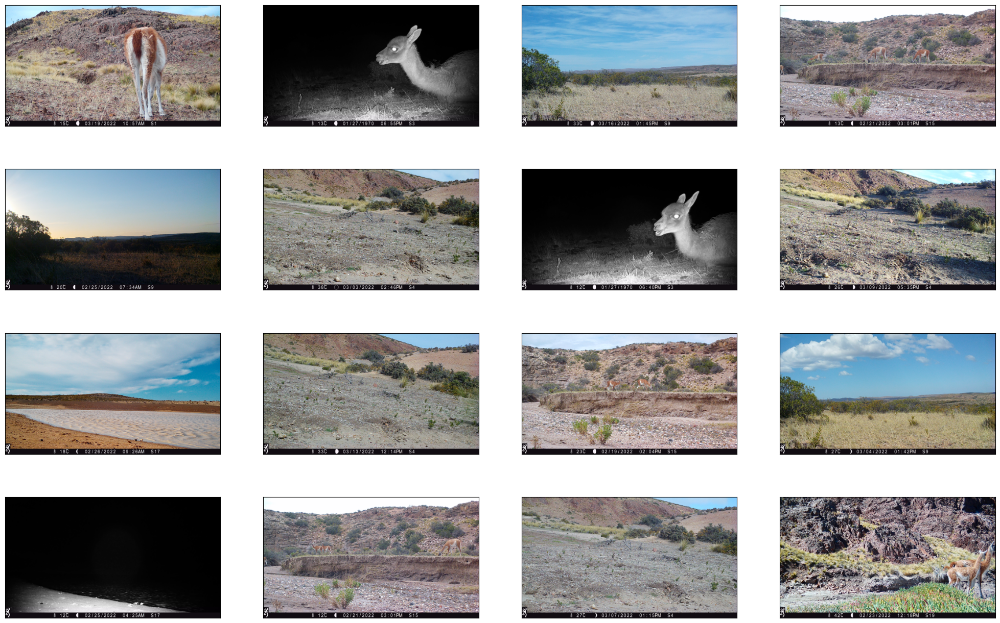

In [10]:
# Crea una figura de 4x4 para mostrar las imágenes en una cuadrícula
fig = plt.figure(figsize=(25, 16))

# Recorre las imágenes y muestra cada una en un subplot
for i, minidf in enumerate(minidf):
    ax = fig.add_subplot(4, 4, i+1, xticks=[], yticks=[])
    response = s3.get_object(Bucket=nombre_bucket_s3, Key=minidf)
    image_data = response['Body'].read()
    im = Image.open(BytesIO(image_data))
    im = im.resize((480,270))
    plt.imshow(im)


En esta muestra de 16 imagenes random de la base se puede ver:
- Solo 5 de las 16 imagenes presentan animales en ellas.
- Hay imagenes que parecen iguales porque al ser una camara trampa siempre esta fija en el mismo lugar, pero si se ven las fechas son distintas.

### Dataframe

In [12]:
# Ruta del dataframe.
ruta_archivo_s3 = 'Muestreo_CT_PatAzul_2020-2023.xlsx'
# Descarga el archivo desde S3
response = s3.get_object(Bucket=nombre_bucket_s3, Key=ruta_archivo_s3)

In [13]:
# Lee el contenido del archivo Excel en un DataFrame de Pandas
excel_data = response['Body'].read()
df = pd.read_excel(BytesIO(excel_data))

In [14]:
# Elimino las columnas vacias --> OJO: hay algunas que tienen datos random tirados por ahi, ni lo revise...
df = df.iloc[:,:8]

In [15]:
# Preview de la base
df

,Sitio,Año,Cámara,Especie,Cantidad,Nombre,Fecha,Hora
0,Sauce,2020,S1,Guanaco,1.0,0-S1- (3).JPG,2020-02-05,20:46:22
1,Sauce,2020,S1,Guanaco,1.0,0-S1- (4).JPG,2020-02-05,20:47:10
2,Sauce,2020,S1,Guanaco,1.0,0-S1- (5).JPG,2020-02-05,20:47:12
3,Sauce,2020,S1,Guanaco,1.0,0-S1- (6).JPG,2020-02-05,20:47:16
4,Sauce,2020,S1,Guanaco,4.0,0-S1- (7).JPG,2020-02-05,20:51:48
...,...,...,...,...,...,...,...,...
2643,Ibérica,2022,IB7,Choique,1.0,IB 22 (6).JPG,2022-05-05,17:57:50
2644,Ibérica,2022,IB7,Choique,1.0,IB 22 (11).JPG,2022-05-13,8:30:26
2645,Ibérica,2022,IB7,Choique,1.0,IB 22 (15).JPG,2022-05-13,8:30:34
2646,Ibérica,2022,IB7,Guanaco,1.0,IB 22 (22).JPG,2022-05-14,8:35:10


In [16]:
# Informacion de la base
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2648 entries, 0 to 2647
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   Sitio     2648 non-null   object        
 1   Año       2648 non-null   int64         
 2   Cámara    2648 non-null   object        
 3   Especie   2648 non-null   object        
 4   Cantidad  2644 non-null   float64       
 5   Nombre    2648 non-null   object        
 6   Fecha     2648 non-null   datetime64[ns]
 7   Hora      2648 non-null   object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(5)
memory usage: 165.6+ KB


- No hay nulos
- Hay 2648 datos

In [17]:
# Cantidad de datos para cada Sitio
df['Sitio'].value_counts()

Sauce      2300
Ibérica     348
Name: Sitio, dtype: int64

In [18]:
# Imprimo las especies presentadas.
print(df['Especie'].unique())
print(len(df['Especie'].unique()))

['Guanaco' 'Zorro Gris' 'Martineta' 'Choique' 'Gato montés' 'passeriforme'
 'Liebre' 'peludo' 'Mara' 'Tucuquere' 'Passeriforme' 'Gaviota' 'Jote'
 'Peludo' 'Piche' 'Chimango' 'Ave S/I' 'Flamenco' 'Aguila Mora' 'Zorrino'
 'Puma' 'Pato' 'Garza Blanca' 'Halcon' 'atahacaminos' 'Bandurrita'
 'Chingolo' 'Ratón' 'Loica' 'Calandria ' 'Zorzal chiguanco'
 'Zorzal Chiguanco' 'Oveja' 'Yal negro' 'Zorrino ' 'Torcaza'
 'Zorro Colorado' 'Carancho' 'Bandurria' 'Aguilucho Comun'
 'Cormoran Imperial' 'Cauquen']
42


#### Normalizar Especies

In [19]:
# Saco mayusculas y tildes
df['Especie'] = df['Especie'].str.lower().apply(unidecode)

In [20]:
# Imprimo las especies presentadas.
print(df['Especie'].unique())
print(len(df['Especie'].unique()))

['guanaco' 'zorro gris' 'martineta' 'choique' 'gato montes' 'passeriforme'
 'liebre' 'peludo' 'mara' 'tucuquere' 'gaviota' 'jote' 'piche' 'chimango'
 'ave s/i' 'flamenco' 'aguila mora' 'zorrino' 'puma' 'pato' 'garza blanca'
 'halcon' 'atahacaminos' 'bandurrita' 'chingolo' 'raton' 'loica'
 'calandria ' 'zorzal chiguanco' 'oveja' 'yal negro' 'zorrino ' 'torcaza'
 'zorro colorado' 'carancho' 'bandurria' 'aguilucho comun'
 'cormoran imperial' 'cauquen']
39


Que hacemos con 'ave s/i'?

#### Normalizar Ruta Archivo

El dataframe no tiene la informacion exacta de la ruta por lo que se crea esta funcion que lo normaliza.

In [21]:
# Le saco las tildes a la base:
df.rename(columns={'Cámara': 'Camara'}, inplace=True)
df['Sitio'] = df['Sitio'].apply(unidecode)

In [22]:
# Le saco los espacios dobles.
df['Nombre'] = df['Nombre'].replace('  ',' ')

In [189]:
df['Ruta'] = df.apply(definirRuta, axis=1)

In [190]:
# Guardo las Rutas que no encontre en s3.
noExiste = (
    'Muestreo ct sauce/CT S 2020/S17/IMG_2492.JPG',
    'Muestreo ct sauce/CT S 2020/S17/z-S17 (86).JPG',
    'Muestreo ct sauce/CT S 2020/S17/S17 - (546).JPG',
    'Muestreo ct sauce/CT S 2020/S17/z-S17 (2798).JPG',
    'Muestreo ct sauce/CT S 2020/S19/IMG_0281.JPG',
    "Muestreo ct sauce/CT S 2020/S19/z-S19 (2890).JPG",
    "Muestreo ct sauce/CT S 2021/S1/1-S1- (1332).JPG",
    'Muestreo ct sauce/CT S 2021/S2/1-S2- (339).JPG',
    'Muestreo ct sauce/CT S 2021/S2/1-S2- (329).JPG',
    'Muestreo ct sauce/CT S 2021/S13/0-S13- (481).JPG',
    'Muestreo ct sauce/CT S 2021/S15/0-S15- (151).JPG',
    'Muestreo ct sauce/CT S 2021/S15/1-S15- (486).JPG',
    'Muestreo ct sauce/CT S 2021/S17/1-S17- (17).JPG',
    'Muestreo ct Iberica/2021/IB6/1-IB6- (1699).JPG'
)

In [191]:
# Funcion que determina si la ruta existe o no en s3. --> compara con las que dije que no existen manualmente.
def existeens3(fila):
    if fila['Ruta'] in noExiste:
        return False
    else:
        return True

In [192]:
# Hago columna 'existe' y aplico la funcion.
df['existe'] = df.apply(existeens3, axis=1)

In [193]:
# Funcion que determina si la ruta esta o no en s3. --> compara con la lista de objetoss3.
def estaens3(fila):
    if fila['Ruta'] in objetos_s3:
        return True
    else:
        return False

In [194]:
# Hago columna 'esta' y aplico la funcion. --> en el caso de que haya determinado que no existe cambio 'esta' a True.
df['esta'] = df.apply(estaens3, axis=1)
df.loc[df['existe']==False,'esta'] = True

In [195]:
# Faltan hacer Match
noExiste += tuple(df[(df['esta'] == False) & (df['Camara']=='S1') & (df['Año']==2022)]['Ruta'] ) # Estas de 2022 S1 no existen.
noExiste += tuple(df[(df['esta'] == False) & (df['Camara']=='S2')& (df['Año']==2022)]['Ruta']) # Estas de 2022 S1 no existen.
noExiste += tuple(df[(df['Camara']=='S3')&(df['Año']==2022)]['Ruta']) # 2022 S3 no existen.
noExiste += tuple(df[(df['esta'] == False) & (df['Camara']=='S5')&(df['Año']==2022)]['Ruta']) # Estas de 2022 S5 no existen.
noExiste += tuple(df[(df['Camara']=='S6')&(df['Año']==2022)]['Ruta']) # 2022 S6 no existen.
noExiste += tuple(df[(df['esta'] == False) & (df['Camara']=='S7')&(df['Año']==2022)]['Ruta']) # Estas de 2022 S7 no existen.
noExiste += tuple(df[(df['esta'] == False) & (df['Camara']=='S8')&(df['Año']==2022)]['Ruta']) # Estas de 2022 S8 no existen.
noExiste += tuple(df[(df['esta'] == False) & (df['Camara']=='S11')&(df['Año']==2022)]['Ruta']) # Estas de 2022 S11 no existen.
noExiste += tuple(df[(df['Camara']=='S13')&(df['Año']==2022)]['Ruta']) # 2022 S13 no existen.
noExiste += tuple(df[(df['Camara']=='S14')&(df['Año']==2022)]['Ruta']) # 2022 S14 no existen. --> por ejemplo la que dice "SAUCE 2022 14 (105).JPG" coincide con "/1/IMG_0035.JPG"
noExiste += tuple(df[(df['Camara']=='S15')&(df['Año']==2022)]['Ruta']) # 2022 S15 no existen. --> por ejemplo la que dice "SAUCE 2022 15 (3540).JPG" coincide con "/1/IMG_0006.JPG"
noExiste += tuple(df[(df['Camara']=='S16')&(df['Año']==2022)]['Ruta']) # 2022 S16 no existen. --> por ejemplo la que dice "SAUCE 2022 16 (503).JPG" coincide con "/1/IMG_0021.JPG"
noExiste += tuple(df[(df['Camara']=='S17')&(df['Año']==2022)]['Ruta']) # 2022 S17 no existen.
noExiste += tuple(df[(df['esta'] == False) & (df['Camara']=='S18')&(df['Año']==2022)]['Ruta']) # Estas de 2022 S18 no existen.
noExiste += tuple(df[(df['esta'] == False) & (df['Camara']=='S19')&(df['Año']==2022)]['Ruta']) # Estas de 2022 S19 no existen.
noExiste += tuple(df[(df['Sitio'] == 'Iberica') & (df['Año']==2022)]['Ruta']) # 2022 Iberica no estan

df['existe'] = df.apply(existeens3, axis=1)
df.loc[df['existe']==False,'esta'] = True

In [196]:
# Muestro las que no estan.
df[(df['esta'] == False)] #PARA VERLAS ACA DE A POCO VOY COMENTANDO EN LA CELDA ANTERIOR ASI VOY VIENDO CARPETA POR CARPETA.

,Sitio,Año,Camara,Especie,Cantidad,Nombre,Fecha,Hora,Ruta,existe,esta


### Base Etiquetada:

In [33]:
# Agarro solo las rutas donde se encontro match en S3.
dfetiquetas = df.loc[df['existe']==True,('Ruta','Cantidad', 'Especie','Fecha','Hora')]

In [ ]:
# Configurar la ruta de ejecutable de Tesseract (reemplaza con la ubicación en tu sistema)
pytesseract.pytesseract.tesseract_cmd = r'/opt/homebrew/bin/tesseract' ## HAY QUE INSTALAR TESSARACT (en la terminal: brew install tesseract)

In [524]:
# Pruebo extraer_fecha
extraerFecha("Muestreo ct sauce/CT S 2021/S15/1-S15- (361).JPG")

'03/16/2021'

In [ ]:
# Pruebo extraer_hora
extraerHora("Muestreo ct sauce/CT S 2020/S1/0-S1- (40).JPG")

In [ ]:
dfetiquetas['checkFecha'] = dfetiquetas['Ruta'].apply(extraerFecha)

In [501]:
dfetiquetas.loc[dfetiquetas['checkFecha'] == '13/16/2021', 'checkFecha'] = dfetiquetas[dfetiquetas['checkFecha'] == '13/16/2021']['Ruta'].apply(extraerFecha)

In [502]:
%store dfetiquetas

Stored 'dfetiquetas' (DataFrame)


In [503]:
# Guardar el DataFrame en un archivo pickle
dfetiquetas.to_pickle('dfetiquetas.pkl')

In [26]:
# Cargar el DataFrame desde el archivo pickle
dfetiquetas = pd.read_pickle('dfetiquetas.pkl')

In [27]:
dfImagenesRotas = dfetiquetas[dfetiquetas['checkFecha'] == '']

In [28]:
dfcheck = dfetiquetas[dfetiquetas['checkFecha'] != '']

In [506]:
%store dfcheck

Stored 'dfcheck' (DataFrame)


In [ ]:
dfcheck.loc[:, 'checkFecha'] = pd.to_datetime(dfcheck['checkFecha'], format='%m/%d/%Y')

In [521]:
# las distintas.
dfcheck[dfcheck['Fecha']!=dfcheck['checkFecha']]

,Ruta,Cantidad,Especie,Fecha,Hora,checkFecha
1154,Muestreo ct sauce/CT S 2021/S7/1-S7- (6).JPG,1.0,guanaco,2021-03-17,08:41:56,2021-03-07
1613,Muestreo ct sauce/CT S 2022/S1/1/1-S1- (7).JPG,1.0,guanaco,2022-02-19,14:03:44,2022-02-22
1647,Muestreo ct sauce/CT S 2022/S2/4/IMG_0654.JPG,2.0,guanaco,2022-02-24,19:54:06,2022-02-25
1652,Muestreo ct sauce/CT S 2022/S2/4/IMG_0784.JPG,1.0,guanaco,2022-03-01,8:07:30,2022-03-02
1689,Muestreo ct sauce/CT S 2022/S4/IMG_6114.JPG,1.0,zorrino,2022-02-18,01:08:42,2022-03-11
...,...,...,...,...,...,...
1895,Muestreo ct sauce/CT S 2022/S11/IMG_0104.JPG,1.0,guanaco,2022-03-05,23:27:56,2022-03-19
1896,Muestreo ct sauce/CT S 2022/S11/IMG_0132.JPG,1.0,guanaco,2022-03-07,06:37:24,2022-03-19
1897,Muestreo ct sauce/CT S 2022/S11/IMG_0148.JPG,1.0,guanaco,2022-03-07,06:38:28,2022-03-19
1898,Muestreo ct sauce/CT S 2022/S11/IMG_0161.JPG,1.0,zorro gris,2022-03-08,02:51:42,2022-03-19


In [1309]:
# Extraigo 16 imagenes random del dataset.
minidf = random.sample(dfetiquetas['Ruta'].tolist(), 16)

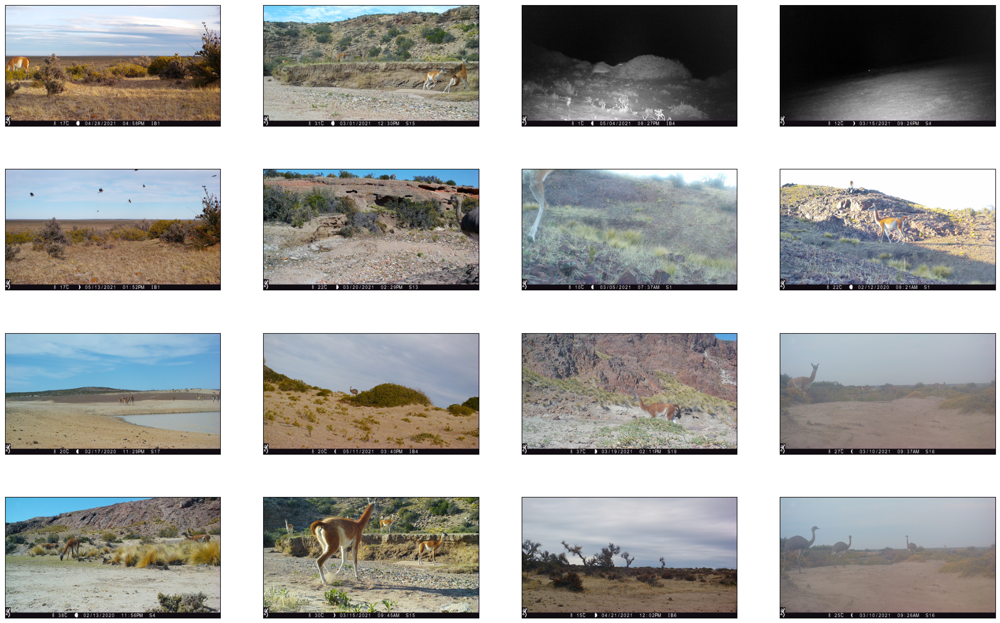

In [958]:
# Crea una figura de 4x4 para mostrar las imágenes en una cuadrícula
fig = plt.figure(figsize=(25, 16))

# Recorre las imágenes y muestra cada una en un subplot
for i, minidf in enumerate(minidf):
    ax = fig.add_subplot(4, 4, i+1, xticks=[], yticks=[])
    response = s3.get_object(Bucket=nombre_bucket_s3, Key=minidf)
    image_data = response['Body'].read()
    im = Image.open(BytesIO(image_data))
    im = im.resize((480,270))
    plt.imshow(im)

#### Error en el etiquetado: 

Se encontro esta imagen que esta etiquetada como Passseriforme y cantidad 1.

In [548]:
# Imagen etiquetada como Passeriforme cantidad 1
df[df['Ruta']=="Muestreo ct sauce/CT S 2020/S17/z-S17 (2792).JPG"] 

,Sitio,Año,Camara,Especie,Cantidad,Nombre,Fecha,Hora,Ruta,esta
709,Sauce,2020,S17,Passeriforme,1.0,z-S17 (2792).JPG,2020-03-01,02:23:04,Muestreo ct sauce/CT S 2020/S17/z-S17 (2792).JPG,True


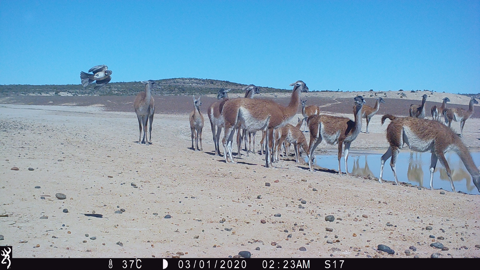

In [547]:
ruta_imagen_s3 = "Muestreo ct sauce/CT S 2020/S17/z-S17 (2792).JPG"

# Descarga la imagen desde S3
response = s3.get_object(Bucket=nombre_bucket_s3, Key=ruta_imagen_s3)

# Lee los datos de la imagen
datos_imagen = response['Body'].read()

# Abre la imagen utilizando Pillow
imagen = Image.open(BytesIO(datos_imagen))

imagen = imagen.resize((480,270))

# Muestra la imagen en el Jupyter Notebook
display(imagen)

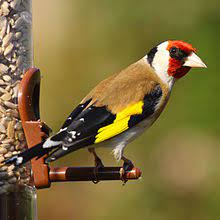

In [549]:
# Passeriforme: 
from IPython.display import Image
image_path = 'passeriforme.jpeg'
Image(filename=image_path)

Lo encontre jaajaj:

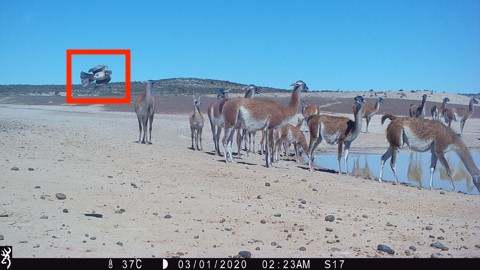

In [970]:
# Passeriforme: 
from IPython.display import Image
image_path = 'passeriformes3.png'
Image(filename=image_path)

##### Passeriforme:

In [967]:
# Extraigo 16 imagenes random etiquetadas como Passeriforme
minidf = random.sample(dfetiquetas.loc[dfetiquetas['Especie']=='passeriforme','Ruta'].tolist(), 16)

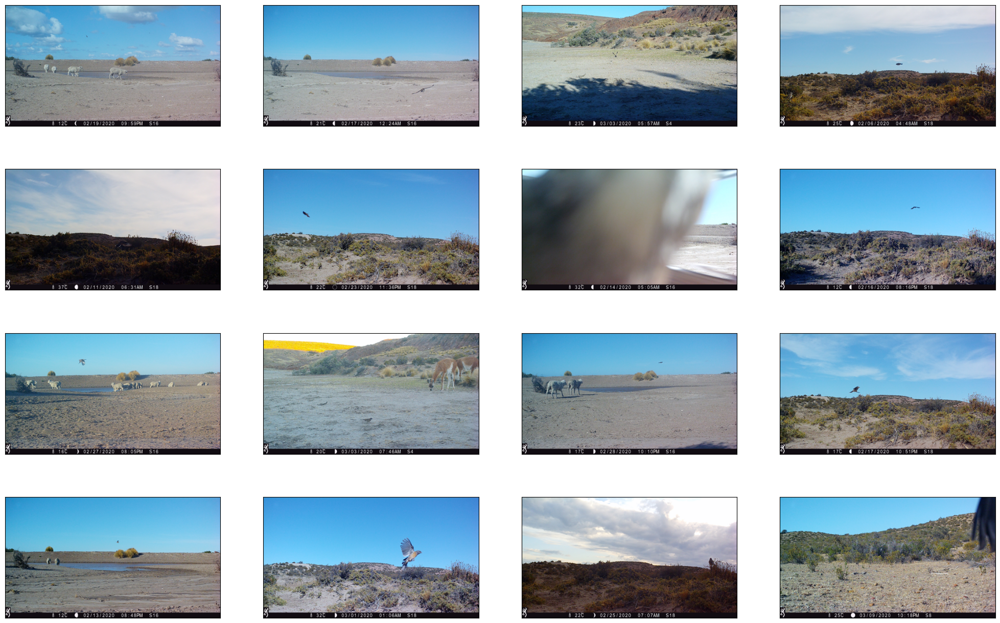

In [968]:
# Crea una figura de 4x4 para mostrar las imágenes en una cuadrícula
fig = plt.figure(figsize=(25, 16))

# Recorre las imágenes y muestra cada una en un subplot
for i, minidf in enumerate(minidf):
    ax = fig.add_subplot(4, 4, i+1, xticks=[], yticks=[])
    response = s3.get_object(Bucket=nombre_bucket_s3, Key=minidf)
    image_data = response['Body'].read()
    im = Image.open(BytesIO(image_data))
    im = im.resize((480,270))
    plt.imshow(im)

##### Guanaco:

In [960]:
# Extraigo 16 imagenes random etiquetadas como Guanaco
minidf = random.sample(dfetiquetas.loc[dfetiquetas['Especie']=='Guanaco','Ruta'].tolist(), 16)

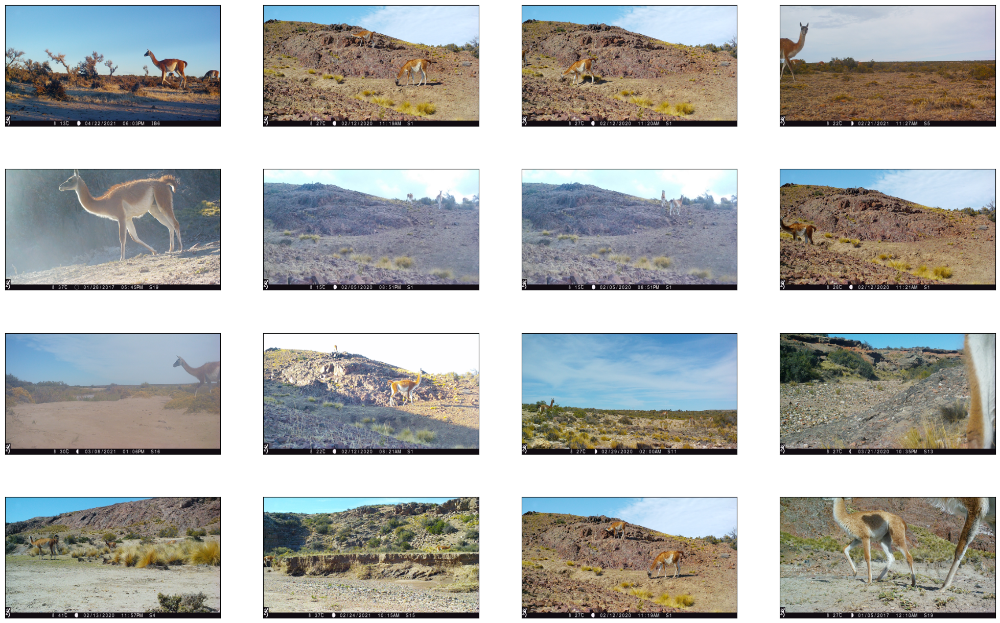

In [961]:
# Crea una figura de 4x4 para mostrar las imágenes en una cuadrícula
fig = plt.figure(figsize=(25, 16))

# Recorre las imágenes y muestra cada una en un subplot
for i, minidf in enumerate(minidf):
    ax = fig.add_subplot(4, 4, i+1, xticks=[], yticks=[])
    response = s3.get_object(Bucket=nombre_bucket_s3, Key=minidf)
    image_data = response['Body'].read()
    im = Image.open(BytesIO(image_data))
    im = im.resize((480,270))
    plt.imshow(im)